In [13]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error
import seaborn as sns
pd.options.display.max_rows = 999

In [2]:
def plot_prediction(sample_id, df):
    df_breath = df[df['breath_id'] == sample_id].reset_index(drop = True)
    cols = ['u_in', 'u_out', 'pressure'] if 'pressure' in df.columns else ['u_in', 'u_out']
    plt.figure(figsize=(12, 4))
    for col in ['oof', 'pressure', 'u_out']:
        plt.plot(df_breath['time_step'], df_breath[col], label=col)
    
    y_true = df_breath[df_breath['u_out']==0].reset_index(drop = True)['pressure'].values
    y_pred  = df_breath[df_breath['u_out']==0].reset_index(drop = True)['oof'].values
    
    metric = mean_absolute_error(y_true,y_pred)  
    plt.legend()
    plt.title(f'Sample {sample_id} , R: {df_breath.R.unique()[0]}, C: {df_breath.C.unique()[0]} - MAE={metric:.3f}')

In [4]:
%%time
oof_preds = pd.read_csv('../03.SavedModels/baseline_lstm_v15/oof_preds.csv')
print(oof_preds.shape)
train_df  = pd.read_csv('../01.Data/train_folds.csv')
oof_preds = oof_preds.merge(train_df,on = ['id','breath_id'],how = 'left')
print(oof_preds.shape)

(6036000, 3)
(6036000, 10)
CPU times: user 6.76 s, sys: 1.96 s, total: 8.72 s
Wall time: 8.72 s


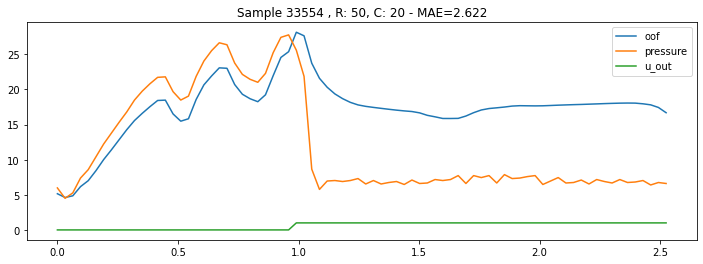

In [5]:
plot_prediction(33554,oof_preds)

In [6]:
metric_df = oof_preds[oof_preds['u_out']==0].reset_index(drop = True)
metric_df['MAE_UNIT'] = abs(metric_df['oof'] - metric_df['pressure'])
metric_df.sort_values(by = ['MAE_UNIT'],ascending = False).groupby(['R','C']).agg({'MAE_UNIT':['mean','count']}).reset_index().sort_values(by = ('MAE_UNIT','mean'),ascending = False)

R   C  MAE_UNIT        
               mean   count
8  50  50  0.242079  253113
7  50  20  0.224046  255953
6  50  10  0.162600  418114
0   5  10  0.159635  249386
3  20  10  0.158175  184106
4  20  20  0.147480  185841
5  20  50  0.144611  243184
2   5  50  0.103553  245700
1   5  20  0.100432  255571

In [7]:
metric_df.sort_values(by = ['MAE_UNIT'],ascending = False).groupby(['R']).agg({'MAE_UNIT':['mean','count']}).reset_index().sort_values(by = ('MAE_UNIT','mean'),ascending = False)

R  MAE_UNIT        
           mean   count
2  50  0.201260  927180
1  20  0.149554  613131
0   5  0.121122  750657

In [23]:
breath_ids = metric_df.groupby(['breath_id','R','C']).agg({'MAE_UNIT':'mean'}).sort_values(by = ['MAE_UNIT'],ascending = False).reset_index().head(300).breath_id.unique()
breath_ids_2 = metric_df.groupby(['breath_id','R','C']).agg({'MAE_UNIT':'mean'}).sort_values(by = ['MAE_UNIT'],ascending = True).reset_index().head(300).breath_id.unique()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


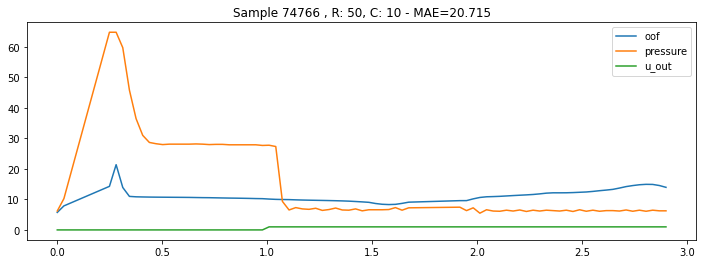

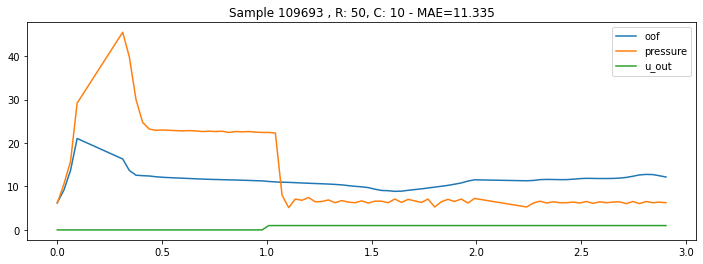

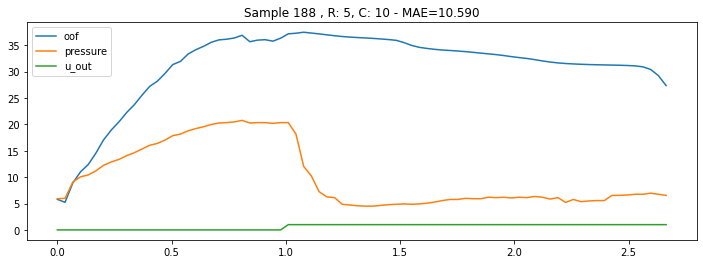

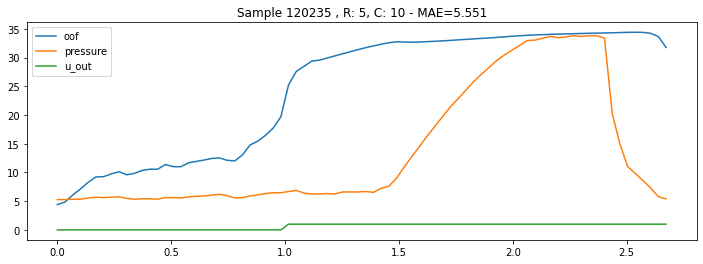

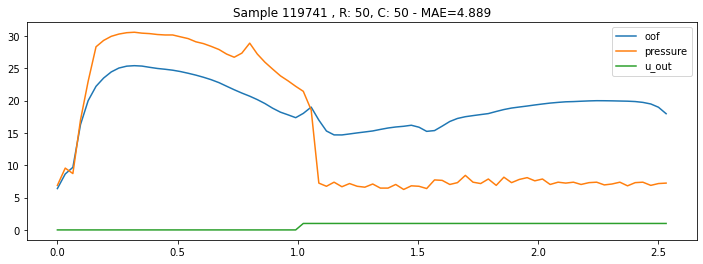

...

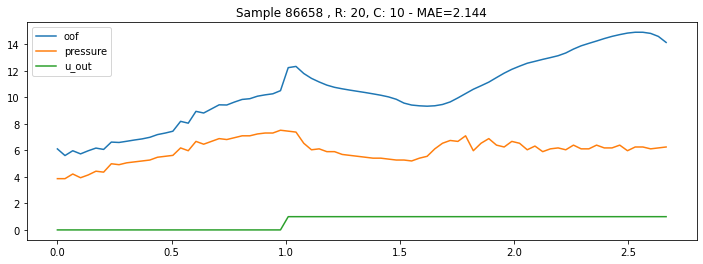

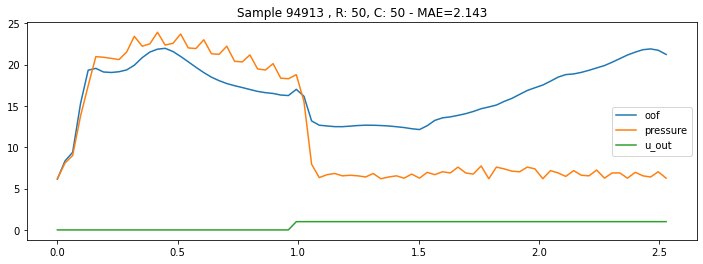

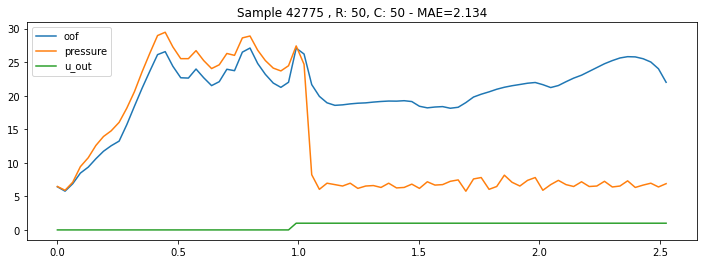

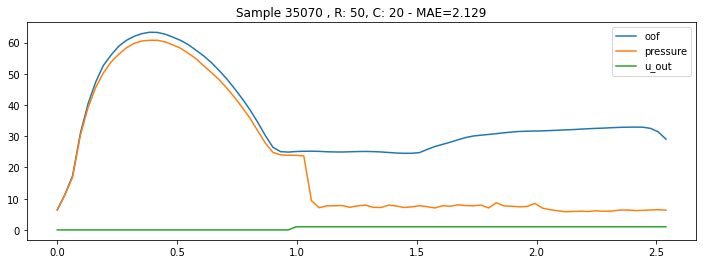

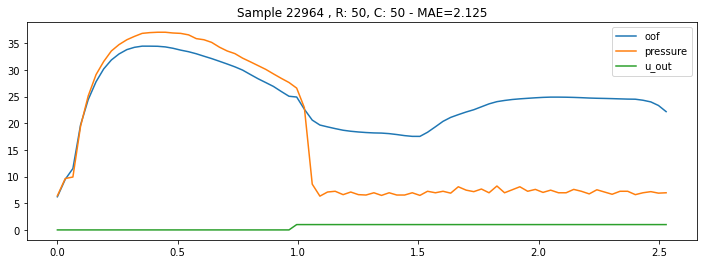

In [24]:
for id in breath_ids:
    plot_prediction(id,oof_preds)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


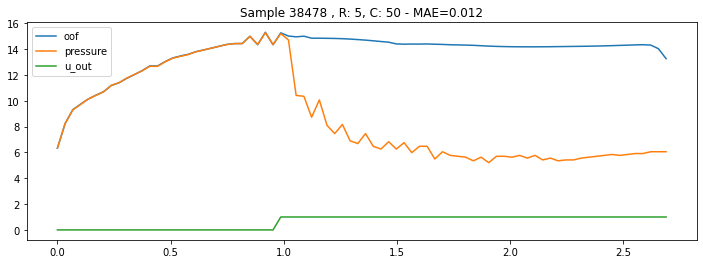

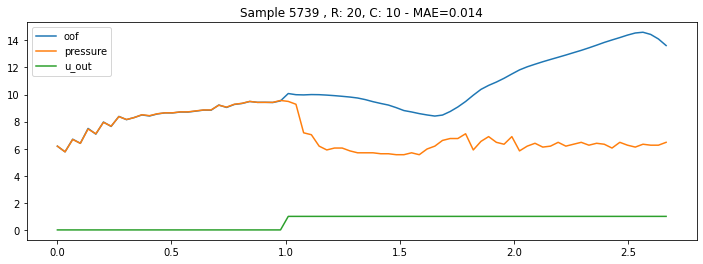

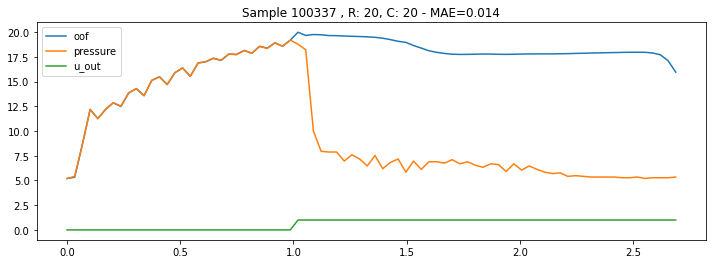

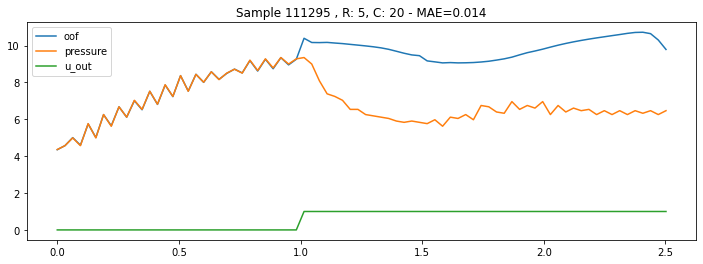

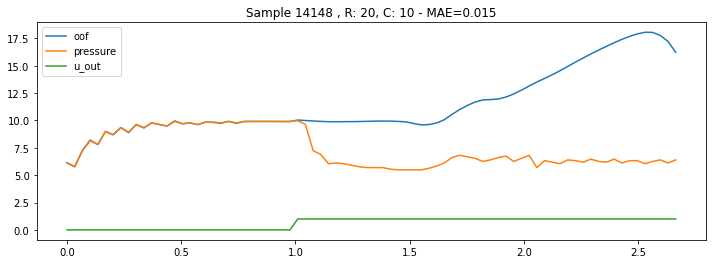

...

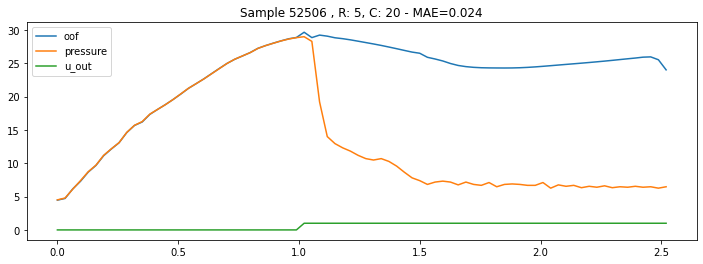

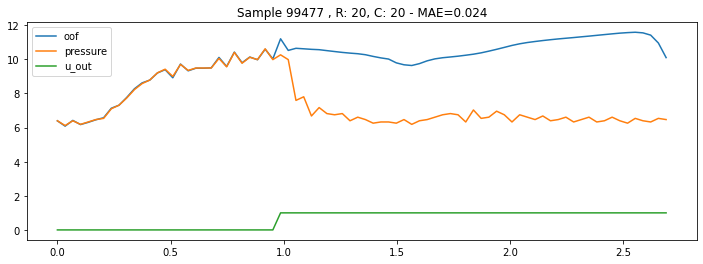

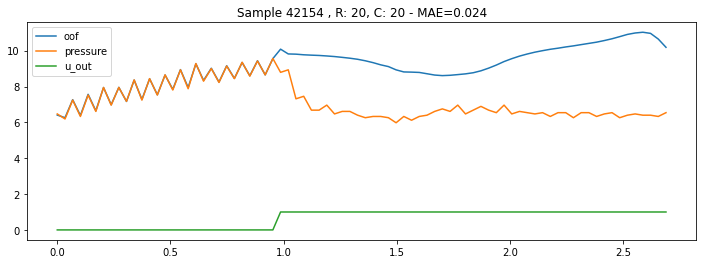

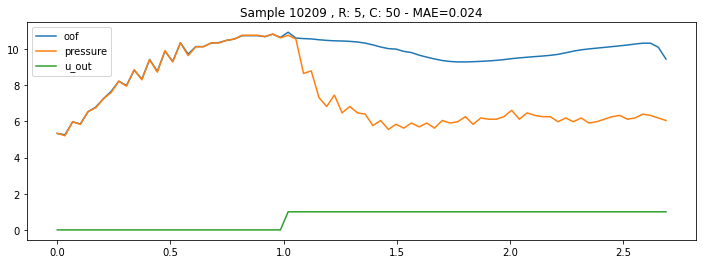

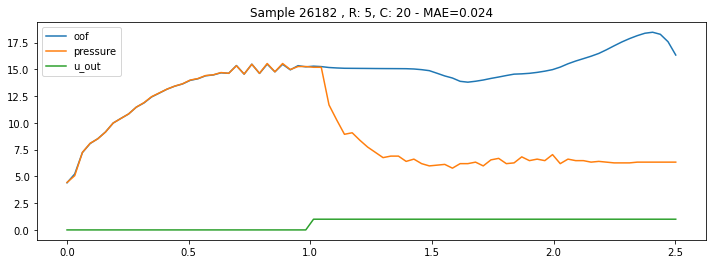

In [25]:
for id in breath_ids_2:
    plot_prediction(id,oof_preds)

## Error Analysis

In [53]:
import pandas as pd
import os
import numpy as np
import sys
module_path = "../src"
if module_path not in sys.path:
    sys.path.append(module_path)
from utils.utils import seed_everything
from utils.scaler import DataScaler
from models.trainer import Trainer
from models.lstm import Model_LSTM
from sklearn.metrics import mean_absolute_error
import wandb
DATA_PATH = '../01.Data'
DEBUG = False

In [77]:
def feat_eng(df):
    # Add Feature engineering df:
    df['area'] = df['time_step'] * df['u_in']
    df['area'] = df.groupby('breath_id')['area'].cumsum()
    df['u_in_cumsum'] = (df['u_in']).groupby(df['breath_id']).cumsum()
    df['cross']= df['u_in']*df['u_out']
    df['cross2']= df['time_step']*df['u_out']
    
    df['u_in_lag1'] = df.groupby('breath_id')['u_in'].shift(1)
    df['u_out_lag1'] = df.groupby('breath_id')['u_out'].shift(1)
    df['u_in_lag_back1'] = df.groupby('breath_id')['u_in'].shift(-1)
    df['u_out_lag_back1'] = df.groupby('breath_id')['u_out'].shift(-1)
    df['u_in_lag2'] = df.groupby('breath_id')['u_in'].shift(2)
    df['u_out_lag2'] = df.groupby('breath_id')['u_out'].shift(2)
    df['u_in_lag_back2'] = df.groupby('breath_id')['u_in'].shift(-2)
    df['u_out_lag_back2'] = df.groupby('breath_id')['u_out'].shift(-2)
    df['u_in_lag3'] = df.groupby('breath_id')['u_in'].shift(3)
    df['u_out_lag3'] = df.groupby('breath_id')['u_out'].shift(3)
    df['u_in_lag_back3'] = df.groupby('breath_id')['u_in'].shift(-3)
    df['u_out_lag_back3'] = df.groupby('breath_id')['u_out'].shift(-3)
    df['u_in_lag4'] = df.groupby('breath_id')['u_in'].shift(4)
    df['u_out_lag4'] = df.groupby('breath_id')['u_out'].shift(4)
    df['u_in_lag_back4'] = df.groupby('breath_id')['u_in'].shift(-4)
    df['u_out_lag_back4'] = df.groupby('breath_id')['u_out'].shift(-4)
    df = df.fillna(0)
    
    df['breath_id__u_in__max'] = df.groupby(['breath_id'])['u_in'].transform('max')
    df['breath_id__u_out__max'] = df.groupby(['breath_id'])['u_out'].transform('max')
    df['breath_id__u_in__diffmax'] = df.groupby(['breath_id'])['u_in'].transform('max') - df['u_in']
    df['breath_id__u_in__diffmean'] = df.groupby(['breath_id'])['u_in'].transform('mean') - df['u_in']
    df['breath_id__u_in__diffmax'] = df.groupby(['breath_id'])['u_in'].transform('max') - df['u_in']
    df['breath_id__u_in__diffmean'] = df.groupby(['breath_id'])['u_in'].transform('mean') - df['u_in']
    
    df['u_in_diff1'] = df['u_in'] - df['u_in_lag1']
    df['u_out_diff1'] = df['u_out'] - df['u_out_lag1']
    df['u_in_diff2'] = df['u_in'] - df['u_in_lag2']
    df['u_out_diff2'] = df['u_out'] - df['u_out_lag2']
    df['u_in_diff3'] = df['u_in'] - df['u_in_lag3']
    df['u_out_diff3'] = df['u_out'] - df['u_out_lag3']
    df['u_in_diff4'] = df['u_in'] - df['u_in_lag4']
    df['u_out_diff4'] = df['u_out'] - df['u_out_lag4']
    
    ####################### New features ############################### 
    df['time_step_diff'] = df.groupby('breath_id')['time_step'].diff().fillna(0)
    
    df[["15_in_sum","15_in_min","15_in_max","15_in_mean"]] = (df\
                                                              .groupby('breath_id')['u_in']\
                                                              .rolling(window=15,min_periods=1)\
                                                              .agg({"15_in_sum":"sum",
                                                                    "15_in_min":"min",
                                                                    "15_in_max":"max",
                                                                    "15_in_mean":"mean"
                                                               })\
                                                               .reset_index(level=0,drop=True))
    
    
    ##############################################################
    
    df['R_indx'] = df['R']
    df['C_indx'] = df['C']
    df['R'] = df['R'].astype(str)
    df['C'] = df['C'].astype(str)
    df['R__C'] = df["R"].astype(str) + '__' + df["C"].astype(str)
    df = pd.get_dummies(df)
    return df    

In [85]:
class Config:
    def __init__(self):
        # =========== General Parameters ========
        self.seed = 42
        self.logging = False
        self.run_folds       = [0,1,2]
        self.max_length = None
        self.RC         = [None,None]
        self.init_weights = 'xavier'
        self.scaler_layer = False
        # ======== Model Parameters =============
        self.input_size  = -1
        self.hidden_size = 400
        self.num_layers  = 4
        self.dropout     = 0.0
        self.bidirectional = True
        self.logit_dim     = 128#50
        self.layer_normalization = False
        # ========= Training Parameters =========
        self.epochs         = 400
        self.device         = 'cuda'
        self.lr             = 1e-3
        self.batch_size     = 2**9
        self.num_workers    = 72 
        self.sc_name        = 'Robust'
        # ======== Early stopping  =============
        self.early_stopping = 400#20
        self.mode           = 'min'
        # ======== Loss Parameters =============
        self.loss_params    = {'name':'MAE_FILTERED'}        
        # ======== Optimizer Parameters ========
        self.optimizer_params = {'name':'Adam',
                            'WD'  : 1e-6} #0

        # ======= Scheduler Parameters =========
        # Mode: ['batch','epoch']
        #scheduler_params = {'name'     : 'Plateu',
        #                    'step_on'  : 'epoch',
        #                    'patience' :  8,#5
        #                    'step_metric': 'valid_loss'}
        #scheduler_params = {'name'     : 'CosineAnnealingLR',
        #                    'step_on'  : 'epoch',
        #                    'step_metric': 'valid_loss',
        #                    'min_lr':1e-7,
        #                    'T_max': 400}
        self.scheduler_params = {'name'     : 'CosineAnnealingWarmRestarts',
                            'step_on'  : 'epoch',
                            'step_metric': 'valid_loss',
                            'min_lr':1e-6,
                            'T_0': 50}
        # ======= Logging and Saving Parameters ===
        self.project_name    = 'Ventilator-Kaggle'
        self.experiment_name = 'baseline_lstm_v15'
        self.fold            = None
        self.output_dir      = '../03.SavedModels' # Relative to trainer path

In [105]:
def error_analisis(test_df,fold_predict,en_mode = 'mean',dataset = 'train_folds.csv'):
    cfg         = Config() 
    cfg.logging = False
    train_df = feat_eng(pd.read_csv(os.path.join(DATA_PATH,dataset)))   
    print('Data loaded')
    # Drop innecsary columns:
    train_df.drop(columns = ['R_indx','C_indx'],inplace = True) 
    test_df.drop(columns = ['R_indx','C_indx'],inplace = True) 
    cfg.cols       = train_df.drop(columns = ['id','breath_id','pressure','u_out','fold']).columns.to_list()
    cfg.input_size = len(cfg.cols)
    if cfg.sc_name is not None:
        scaler   = DataScaler(train_df,sc_name = cfg.sc_name,cols = cfg.cols)
        train_df = scaler.transform(train_df)
        test_df  = scaler.transform(test_df)
    
    print(train_df.shape,test_df.shape)
    preds_kfold = 0
    list_preds  = []
    for fold in fold_predict:
        print(f"***********************************************")
        print(f"**************** FOLD : {fold} *********************")
        print(f"***********************************************")
        cfg.fold        = fold
        cfg.output_path = os.path.join(cfg.output_dir,cfg.experiment_name,f'fold_{fold}')
         # Model Part
        seed_everything(cfg.seed)
        model    = Model_LSTM(cfg)
        trainer  = Trainer(config = cfg,model = model) 
        _, test_preds = trainer.predict(test_df,os.path.join(cfg.output_path,'model.pt'))
        list_preds.append(test_preds.reshape(-1))
        preds_kfold   += test_preds
    # Saving test preds
    if en_mode == 'mean':
        test_df['preds'] = (preds_kfold/len(fold_predict)).reshape(-1)
    elif en_mode == 'median': 
        test_df['preds'] = np.median(np.vstack(list_preds),axis=0)
    return test_df

In [106]:
breath_ids = metric_df.groupby(['breath_id','R','C']).agg({'MAE_UNIT':'mean'}).sort_values(by = ['MAE_UNIT'],ascending = False).reset_index().head(300).breath_id.unique()
test_df = train_df[train_df['breath_id'].isin(breath_ids)].reset_index(drop = True)
test_df['R'] = [[5,20,50]]*len(test_df)
test_df['C'] = [[10,20,50]]*len(test_df)
test_df = test_df.explode('R')
test_df = test_df.explode('C')
test_df = feat_eng(test_df)
test_df = error_analisis(test_df,[0,1,2,3,4,6,7,5,8,9],'median','train_folds_cv10.csv') 

Data loaded
(6036000, 59) (216000, 59)
***********************************************
**************** FOLD : 0 *********************
***********************************************
No layer Normalization at the head
init LSTM(54, 400, num_layers=4, batch_first=True, bidirectional=True)


100%|██████████| 1/1 [00:04<00:00,  4.73s/it]


***********************************************
**************** FOLD : 1 *********************
***********************************************
No layer Normalization at the head
init LSTM(54, 400, num_layers=4, batch_first=True, bidirectional=True)


100%|██████████| 1/1 [00:04<00:00,  4.84s/it]


***********************************************
**************** FOLD : 2 *********************
***********************************************
No layer Normalization at the head
init LSTM(54, 400, num_layers=4, batch_first=True, bidirectional=True)


100%|██████████| 1/1 [00:04<00:00,  4.68s/it]


***********************************************
**************** FOLD : 3 *********************
***********************************************
No layer Normalization at the head
init LSTM(54, 400, num_layers=4, batch_first=True, bidirectional=True)


100%|██████████| 1/1 [00:04<00:00,  4.71s/it]


***********************************************
**************** FOLD : 4 *********************
***********************************************
No layer Normalization at the head
init LSTM(54, 400, num_layers=4, batch_first=True, bidirectional=True)


100%|██████████| 1/1 [00:04<00:00,  4.83s/it]


***********************************************
**************** FOLD : 6 *********************
***********************************************
No layer Normalization at the head
init LSTM(54, 400, num_layers=4, batch_first=True, bidirectional=True)


100%|██████████| 1/1 [00:04<00:00,  4.93s/it]


***********************************************
**************** FOLD : 7 *********************
***********************************************
No layer Normalization at the head
init LSTM(54, 400, num_layers=4, batch_first=True, bidirectional=True)


100%|██████████| 1/1 [00:04<00:00,  4.69s/it]


***********************************************
**************** FOLD : 5 *********************
***********************************************
No layer Normalization at the head
init LSTM(54, 400, num_layers=4, batch_first=True, bidirectional=True)


100%|██████████| 1/1 [00:04<00:00,  4.77s/it]


***********************************************
**************** FOLD : 8 *********************
***********************************************
No layer Normalization at the head
init LSTM(54, 400, num_layers=4, batch_first=True, bidirectional=True)


100%|██████████| 1/1 [00:04<00:00,  4.80s/it]


***********************************************
**************** FOLD : 9 *********************
***********************************************
No layer Normalization at the head
init LSTM(54, 400, num_layers=4, batch_first=True, bidirectional=True)


100%|██████████| 1/1 [00:04<00:00,  4.62s/it]


In [109]:
def apply_rc(row):
    if row['R_20'] == 1:
        r = 20
    elif row['R_5'] == 1:
        r = 5
    else:
        r = 50
    
    if row['C_10'] == 1:
        c = 10
    elif row['C_20'] == 1:
        c = 20
    else:
        c = 50
    
    return r,c

In [117]:
test_df[['R','C']] = test_df.apply(lambda x: apply_rc(x),axis = 1,result_type ='expand')
test_df[['RC']] = test_df['R'].astype(str) + '_' +  test_df['C'].astype(str)

In [133]:
test_df[['breath_id','RC','preds','time_step']].breath_id.unique()

array([   111,    188,    392,    795,   1444,   1495,   1640,   2339,
         3421,   3581,   3766,   3849,   4683,   4808,   4930,   7598,
         7779,   8021,   8588,   9206,  10202,  10280,  11007,  11821,
        12660,  12722,  12812,  13069,  13241,  13634,  13763,  14171,
        14322,  15366,  15775,  16497,  16503,  17281,  19196,  19444,
        19954,  20215,  20602,  20619,  21690,  21874,  22964,  23019,
        23277,  23457,  24018,  25050,  25175,  25252,  25787,  26015,
        26072,  26105,  26691,  26913,  27043,  27873,  27995,  28178,
        28451,  28797,  28969,  29034,  30183,  30635,  30871,  31016,
        31501,  32069,  32631,  32859,  33267,  33554,  33649,  33759,
        34738,  35070,  35102,  35657,  36837,  37038,  37768,  38572,
        38791,  40036,  42723,  42775,  44358,  44481,  45177,  45270,
        45362,  45690,  45873,  45991,  47066,  48269,  48727,  49745,
        49924,  50142,  51092,  51196,  51475,  51538,  51753,  52216,
      

In [128]:
def plot_prediction_multiple_rc(sample_id, df):
    df_breath = df[df['breath_id'] == sample_id].reset_index(drop = True)
    plt.figure(figsize=(12, 4))
    for col in ['pressure', 'u_out']:
        plt.plot(df_breath['time_step'], df_breath[col], label=col)
    plt.legend()
    plt.title(f'Sample {sample_id} ,REAL -> R: {df_breath.R.unique()[0]}, C: {df_breath.C.unique()[0]}')    
    sns.lineplot(x = "time_step", y = "preds",
                 hue = "RC",
                 data = df_breath)
    plt.legend()
    plt.title(f'Sample {sample_id} ,REAL -> R: {df_breath.R.unique()[0]}, C: {df_breath.C.unique()[0]}')

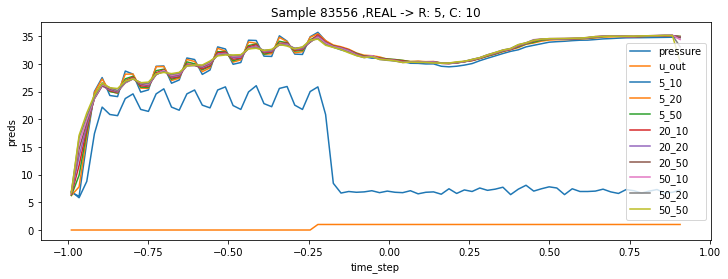

In [139]:
plot_prediction_multiple_rc(83556,test_df)